# Hoja de Trabajo #2 - Mineria de datos
### Autores:
- Luis Santos: 20226
- Roberto Vallecillos: 20441
- Diego Cordova: 20212

## Importar librerias

In [224]:
import pandas as pd
import numpy as np
from quickda.explore_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
import matplotlib.pyplot as plt
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns

%matplotlib inline

## Leer la información y los nombres de las columnas

In [225]:
data = pd.read_csv("breast-cancer-wisconsin.data", header=None)

with open("breast-cancer-wisconsin.names") as file:
    columnNames = [line.rstrip().split("  ")[0] for line in file]

data.columns = columnNames

## Reemplazar valores faltantes con el promedio de la columna

In [226]:
data = data.replace("?", np.nan)
data["Bare Nuclei"] = data["Bare Nuclei"].astype("float64")

for column in data.columns[data.isnull().any()]:
    average = int(data[column].mean(numeric_only=True))
    data[column].fillna(value = average, inplace = True)
  
data["Bare Nuclei"] = data["Bare Nuclei"].astype("int64")

print(data)

     Sample code number  Clump Thickness  Uniformity of Cell Size  \
0               1000025                5                        1   
1               1002945                5                        4   
2               1015425                3                        1   
3               1016277                6                        8   
4               1017023                4                        1   
..                  ...              ...                      ...   
694              776715                3                        1   
695              841769                2                        1   
696              888820                5                       10   
697              897471                4                        8   
698              897471                4                        8   

     Uniformity of Cell Shape  Marginal Adhesion  Single Epithelial Cell Size  \
0                           1                  1                            2   
1        

## Verificar si hay datos nulos

In [227]:
print("Hay datos nulos?", data.isnull().values.any())

Hay datos nulos? False


## 1.1 Haga una exploración rápida de sus datos para eso haga un resumen de su dataset.

In [228]:
data.head()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [229]:
explore(data, method="summarize")

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Sample code number,int64,699,0,0.0,645,61634,870688.5,1171710.0,1238298.0,13454352,1071704.099,1171710.0,617095.730,13.675
Clump Thickness,int64,699,0,0.0,10,1,2.0,4.0,6.0,10,4.418,4.0,2.816,0.593
Uniformity of Cell Size,int64,699,0,0.0,10,1,1.0,1.0,5.0,10,3.134,1.0,3.051,1.233
Uniformity of Cell Shape,int64,699,0,0.0,10,1,1.0,1.0,5.0,10,3.207,1.0,2.972,1.162
Marginal Adhesion,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.807,1.0,2.855,1.524
Single Epithelial Cell Size,int64,699,0,0.0,10,1,2.0,2.0,4.0,10,3.216,2.0,2.214,1.712
Bare Nuclei,int64,699,0,0.0,10,1,1.0,1.0,5.0,10,3.532,1.0,3.603,1.011
Bland Chromatin,int64,699,0,0.0,10,1,2.0,3.0,5.0,10,3.438,3.0,2.438,1.100
Normal Nucleoli,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.867,1.0,3.054,1.422
Mitoses,int64,699,0,0.0,9,1,1.0,1.0,1.0,10,1.589,1.0,1.715,3.561


In [230]:
data.describe()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
count,6.990000e+02,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000
mean,1.071704e+06,4.417740,3.134478,3.207439,2.806867,3.216023,3.532189,3.437768,2.866953,1.589413,2.689557
std,6.170957e+05,2.815741,3.051459,2.971913,2.855379,2.214300,3.602774,2.438364,3.053634,1.715078,0.951273
min,6.163400e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.706885e+05,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171710e+06,4.000000,1.000000,1.000000,1.000000,2.000000,1.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238298e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


In [231]:
ProfileReport(data)

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


## 1.2. Diga el tipo de cada una de las variables del dataset (cualitativa o categórica, cuantitativa continua, cuantitativa discreta)

Como se puede observar en el resumen anterior, existen 11 variables en el dataset. 9 de estas son numericas y 2 son categoricas.

Categoricas:
  - Class
  - Sample code number

Cuantitativas:
  - Clumb Thickness (discreta)
  - Uniformity of cell Size (discreta)
  - Uniformity of Cell Shape (discreta)
  - Marginal Adhesion (discreta)
  - Single Epithelial Cell Size (discreta)
  - Single Epithelial Cell Size (discreta)
  - Bland Chromatin (discreta)
  - Normal Nucleoli (discreta) 
  - Mitoses (discreta)


## 1.3. Incluya los gráficos exploratorios siendo consecuentes con el tipo de variable que están representando.

Outlier Analysis - Boxplot


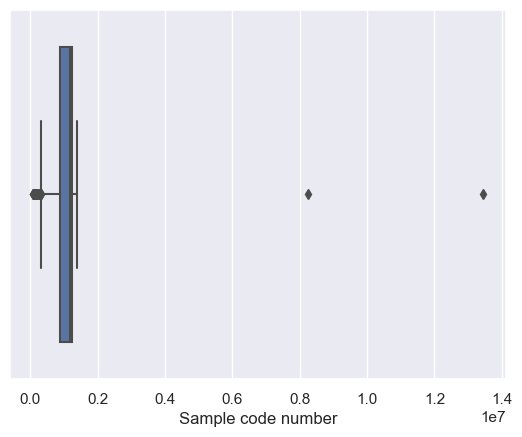

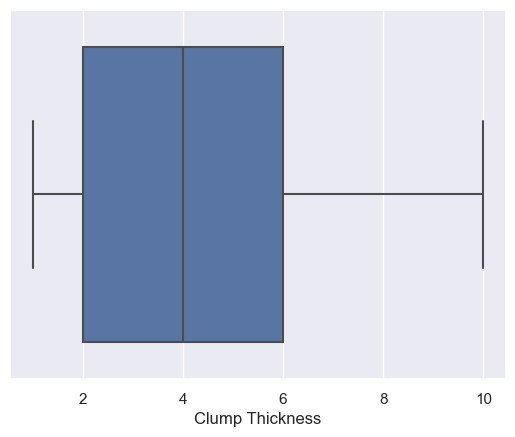

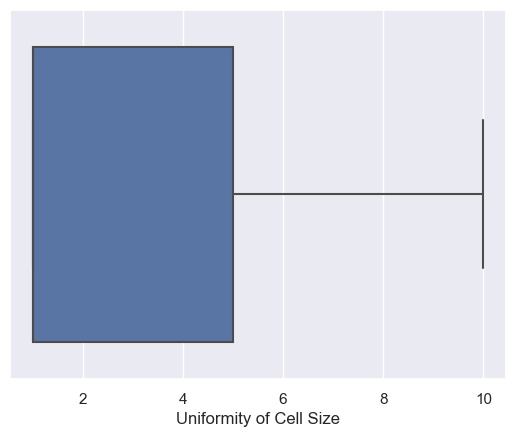

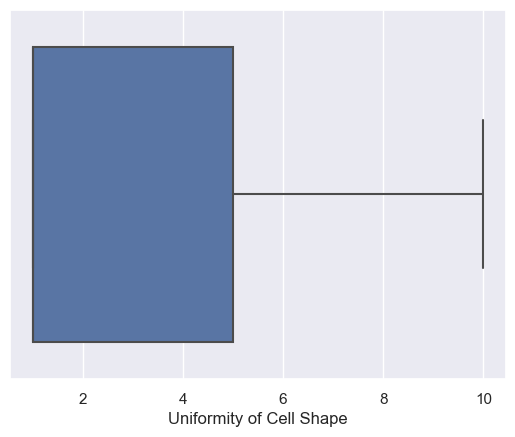

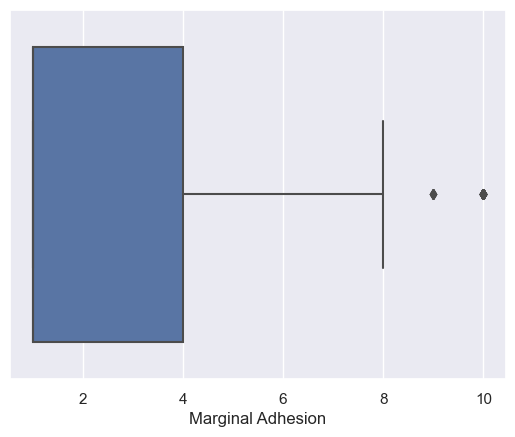

...

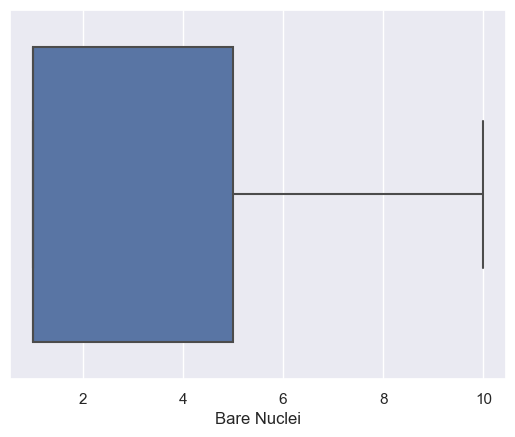

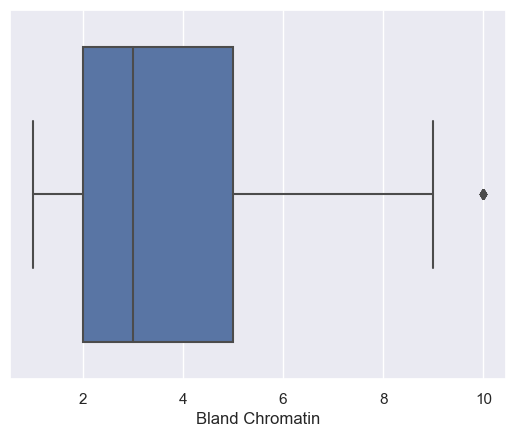

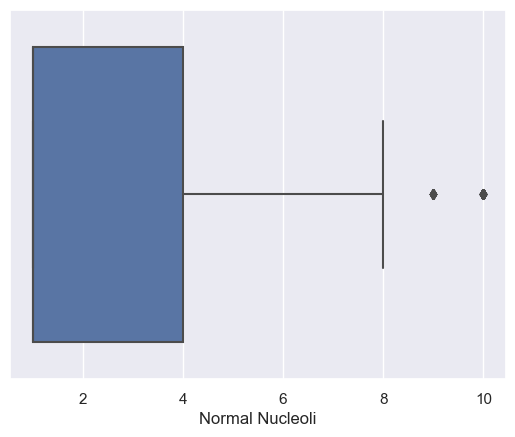

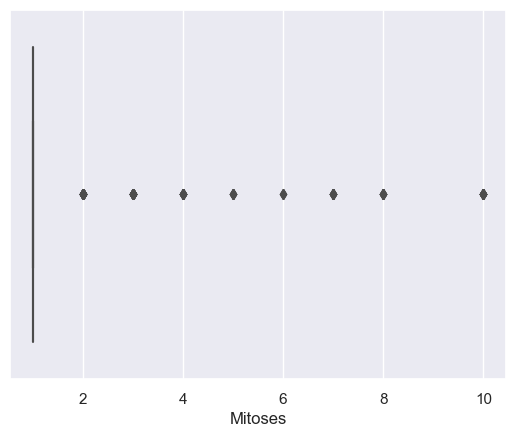

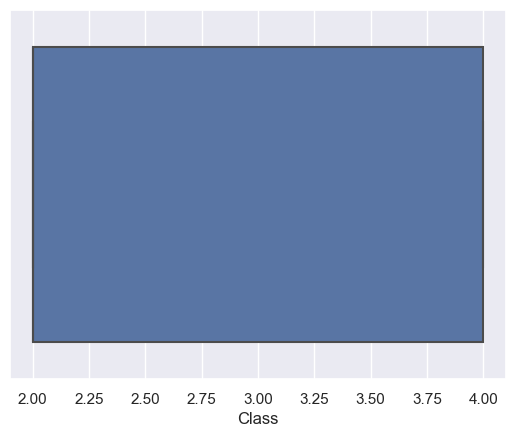

Distribution Analysis - Histogram


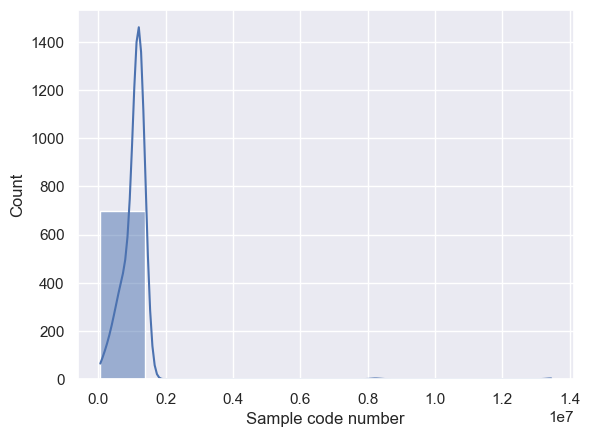

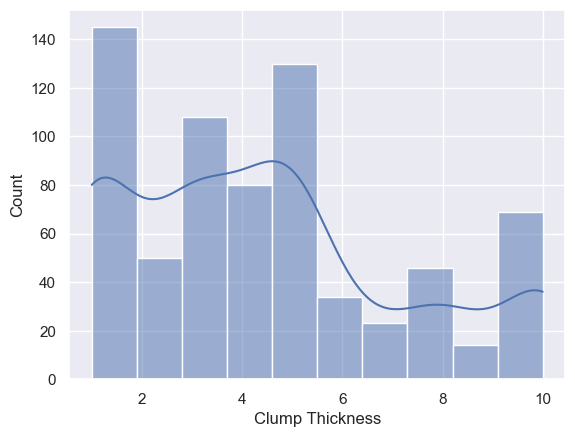

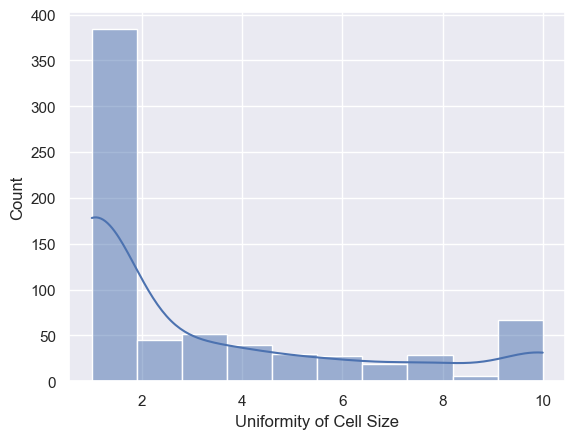

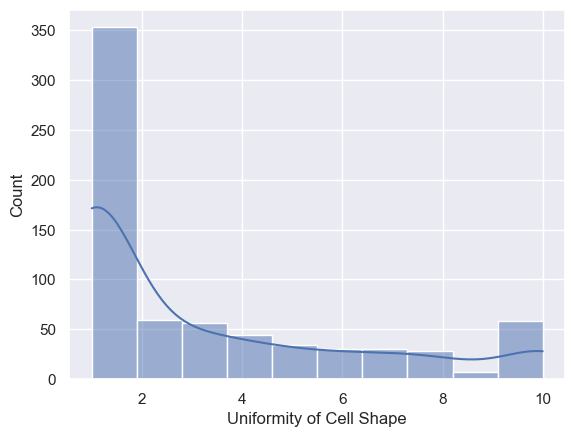

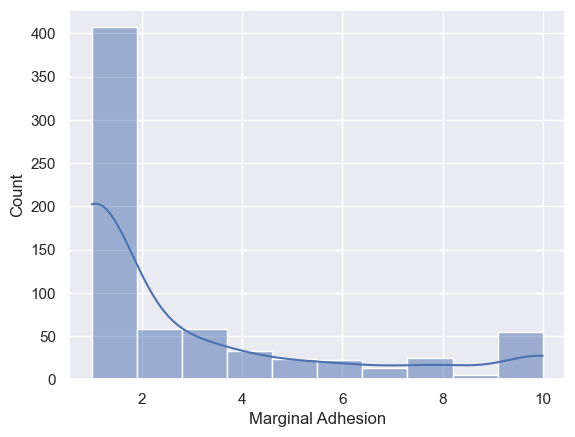

...

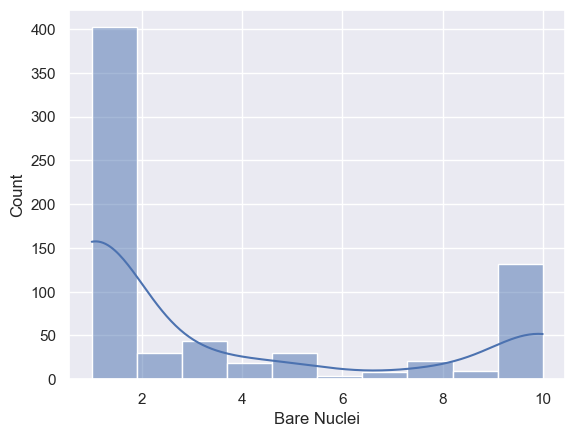

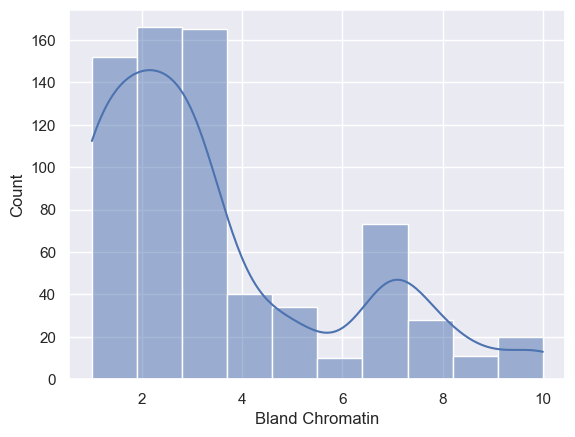

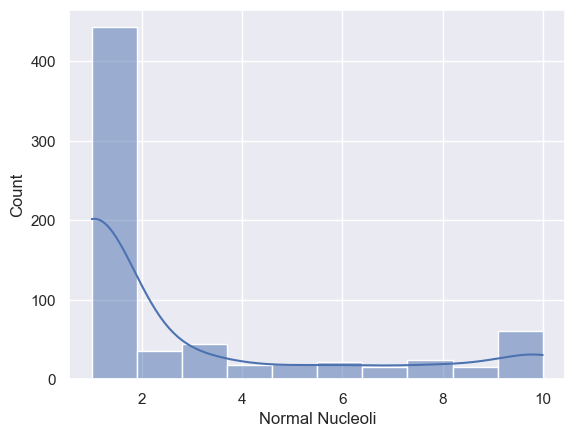

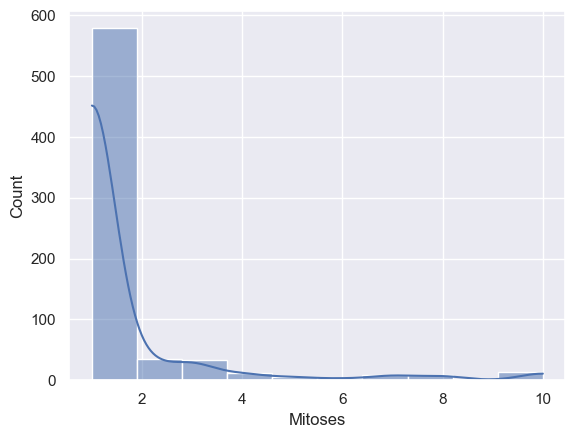

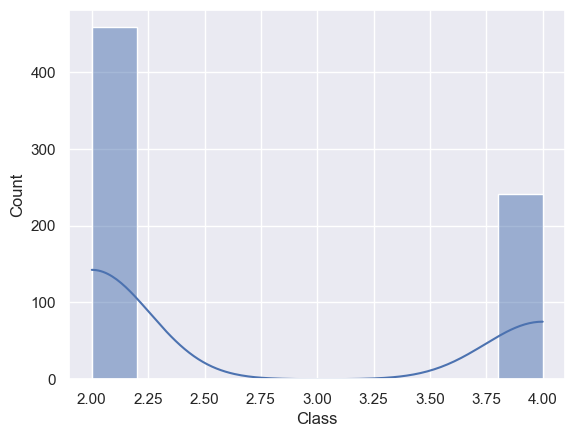

In [ ]:
eda_num(data)

## 1.4. Aísle las variables numéricas de las categóricas, haga un análisis de correlación entre las mismas.

In [ ]:
eda_num(data, method='correlation')

Correlation Analysis - Heatmap


/Users/ls/Library/Python/3.9/lib/python/site-packages/quickda/explore_numeric.py:30: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
Sample code number,1.00,-0.06,-0.04,-0.04,-0.06,-0.05,-0.10,-0.06,-0.05,-0.03,-0.08
Clump Thickness,-0.06,1.00,0.64,0.65,0.49,0.52,0.59,0.56,0.54,0.35,0.72
Uniformity of Cell Size,-0.04,0.64,1.00,0.91,0.71,0.75,0.69,0.76,0.72,0.46,0.82
Uniformity of Cell Shape,-0.04,0.65,0.91,1.00,0.68,0.72,0.71,0.74,0.72,0.44,0.82
Marginal Adhesion,-0.06,0.49,0.71,0.68,1.00,0.60,0.67,0.67,0.60,0.42,0.70
Single Epithelial Cell Size,-0.05,0.52,0.75,0.72,0.60,1.00,0.58,0.62,0.63,0.48,0.68
Bare Nuclei,-0.10,0.59,0.69,0.71,0.67,0.58,1.00,0.68,0.58,0.34,0.82
Bland Chromatin,-0.06,0.56,0.76,0.74,0.67,0.62,0.68,1.00,0.67,0.34,0.76
Normal Nucleoli,-0.05,0.54,0.72,0.72,0.60,0.63,0.58,0.67,1.00,0.43,0.71
Mitoses,-0.03,0.35,0.46,0.44,0.42,0.48,0.34,0.34,0.43,1.00,0.42


## 1.5. Utilice las variables categóricas, haga tablas de frecuencia, proporción, gráficas de barras o cualquier otra técnica que le permita explorar los datos

In [ ]:
eda_cat(data, x='class')

'class'


In [ ]:
print('El valor maximo de "sanple code number" es:', data['Sample code number'].max())
print('El valor minimo de "sanple code number" es:', data['Sample code number'].min())

El valor maximo de "sanple code number" es: 13454352
El valor minimo de "sanple code number" es: 61634


## 1.6. Realice la limpieza de variables utilizando las técnicas vistas en clase, u otras que piense pueden ser de utilidad

In [ ]:
from quickda.clean_data import clean
data = data.drop([
  'Sample code number'
],axis=1)
data.drop(data[data['Bare Nuclei'] == "?"].index, inplace = True)
data = clean(data, method='standardize')
data = clean(data, method='duplicates')
data

,clump_thickness,uniformity_of_cell_size,uniformity_of_cell_shape,marginal_adhesion,single_epithelial_cell_size,bare_nuclei,bland_chromatin,normal_nucleoli,mitoses,class
0,5,1,1,1,2,1,3,1,1,2
1,5,4,4,5,7,10,3,2,1,2
2,3,1,1,1,2,2,3,1,1,2
3,6,8,8,1,3,4,3,7,1,2
4,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
693,3,1,1,1,2,1,2,1,2,2
694,3,1,1,1,3,2,1,1,1,2
696,5,10,10,3,7,3,8,10,2,4
697,4,8,6,4,3,4,10,6,1,4


## 2.1. Pruebe los modelos de Regresión Logística y el de K-NN

In [ ]:
from sklearn.model_selection import train_test_split
x = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)

In [ ]:
print(X_entreno)

[[ 7  6  3 ...  7  4  6]
 [ 2  1  2 ...  3  1  1]
 [ 6  3  2 ...  4  1  1]
 ...
 [ 5 10  8 ...  3  6  3]
 [ 9  5  8 ...  2  1  5]
 [ 8  7  8 ...  5 10  2]]


In [ ]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)


In [ ]:
print(X_entreno)

[[ 0.56445019  0.51580109 -0.43277635 ...  1.07455602  0.01100843
   1.83959859]
 [-1.22073963 -1.00436226 -0.74935271 ... -0.43681139 -0.86797203
  -0.45492597]
 [ 0.20741223 -0.39629692 -0.74935271 ... -0.05896954 -0.86797203
  -0.45492597]
 ...
 [-0.14962574  1.73193178  1.15010544 ... -0.43681139  0.5969954
   0.46288386]
 [ 1.27852612  0.21176842  1.15010544 ... -0.81465325 -0.86797203
   1.38069368]
 [ 0.92148816  0.81983376  1.15010544 ...  0.31887232  1.76896934
   0.00397894]]


In [ ]:
from sklearn.linear_model import LogisticRegression
clasificador = LogisticRegression(random_state = 0)
clasificador.fit(X_entreno, y_entreno)

LogisticRegression(random_state=0)

In [ ]:
print(clasificador.predict(normalizador.transform([[1,1,1,1,1,1,1,1,1]])))

[2]


In [ ]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[4 4]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 4]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 4]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]]


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
matconf = confusion_matrix(y_prueba, y_pred)
print(matconf)
accuracy_score(y_prueba, y_pred)

[[58  1]
 [ 3 54]]


0.9655172413793104

In [ ]:
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_entreno, y_entreno)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
pred = knn.predict(X_prueba)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_prueba, pred))
print(classification_report(y_prueba, pred))

[[57  2]
 [ 7 50]]
              precision    recall  f1-score   support

           2       0.89      0.97      0.93        59
           4       0.96      0.88      0.92        57

    accuracy                           0.92       116
   macro avg       0.93      0.92      0.92       116
weighted avg       0.93      0.92      0.92       116



In [ ]:
tasa_error = []

# Puede tardar un poco
for i in range(1, 40):
    
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_entreno, y_entreno)
    pred_i = knn.predict(X_prueba)
    tasa_error.append(np.mean(pred_i != y_prueba))

Text(0, 0.5, 'Tasa de Error')

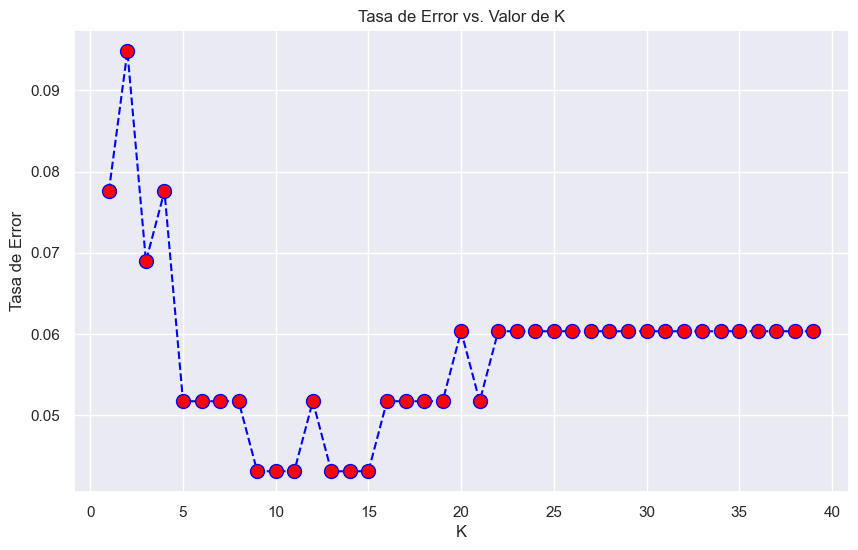

In [ ]:
plt.figure(figsize = (10, 6))
plt.plot(range(1, 40), tasa_error, color = 'blue', linestyle = 'dashed', marker = 'o',
         markerfacecolor = 'red', markersize = 10)
plt.title('Tasa de Error vs. Valor de K')
plt.xlabel('K')
plt.ylabel('Tasa de Error')

Se puede observar que con valores de k entre 2 y 9 aproximadamente, el margen de error es de 0.08. Por esto, se decidió usar k = 9

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 9)
knn.fit(X_entreno, y_entreno)
pred = knn.predict(X_prueba)

print('CON K = 9')
print('\n-> Matriz de Confusión')
print(confusion_matrix(y_prueba,pred))
print('\n-> Reporte')
print(classification_report(y_prueba,pred))

CON K = 9

-> Matriz de Confusión
[[58  1]
 [ 4 53]]

-> Reporte
              precision    recall  f1-score   support

           2       0.94      0.98      0.96        59
           4       0.98      0.93      0.95        57

    accuracy                           0.96       116
   macro avg       0.96      0.96      0.96       116
weighted avg       0.96      0.96      0.96       116



## 2.2. ¿Cuál es el modelo con mejor rendimiento? Utilice las métricas vistas en clase para dar respaldo a su respuesta

En este caso, el modelo con mejor rendimiento es el realizado con KNN y k = 9.
Esto debiddo a que tiene valores más altos al momento de mostrar el reporte de clasificación.

> Por ejemplo, el modelo por regresión logistica tiene un accuracy de 0.90 mientras que el del KNN es de 0.92